# Chapter 1: Working with Audio Data

**Following the [Hugging Face Audio Course](https://huggingface.co/learn/audio-course/) always trying to use soundscapes or sound libraries instead of speech.**

Instead of using the default trumpet or MINDS-14 speech dataset, I'm using two sounds from Free to Use Sounds library:
- **Thunder** — rain, cicadas, dripping water recorded in Ubud, Indonesia 🌧️
- **Chimes** — musical chimes with different tones, recorded in Georgia 🔔

These are interesting because they have *very different spectral signatures*: thunder/rain is broadband noise spread across all frequencies, while chimes are tonal with clear harmonic peaks. We'll see this difference clearly in the spectrograms.

For the dataset section, I use **ESC-50** (Environmental Sound Classification) instead of MINDS-14, because my focus is on soundscapes, not speech.

**What this chapter covers:**
1. What audio data actually is (sampling, amplitude, bit depth)
2. Waveforms, frequency spectra, spectrograms, mel spectrograms
3. Loading & exploring a HF dataset (ESC-50)
4. Preprocessing: resampling, feature extraction with Whisper
5. Streaming large datasets

Let's go.

## Setup

In [1]:
# Run this first in Colab
!pip install -q librosa matplotlib numpy datasets transformers soundfile gradio

In [2]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf
from IPython.display import Audio, display

## Part 1: Load your own audio files

If you're running this in Colab, upload your wav files first (click on Choose Files):

In [3]:
from google.colab import files
uploaded = files.upload()  # file picker

Saving chimes.wav to chimes.wav
Saving thunder.wav to thunder.wav


In [4]:
# --- Set your file paths here ---
THUNDER_FILE = "thunder.wav"
CHIMES_FILE = "chimes.wav"

Before we load anything, let's peek at the raw file metadata. This tells us what we're dealing with *before* any processing.

In [5]:
# Load and inspect both files
for name, path in [("Thunder", THUNDER_FILE), ("Chimes", CHIMES_FILE)]:
    y, sr = librosa.load(path, sr=None)
    print(f"\n🔊 {name}")
    print(f"   Duration:      {len(y)/sr:.1f} seconds")
    print(f"   Sample rate:   {sr:,} Hz")
    print(f"   Samples:       {len(y):,}")
    print(f"   dtype:         {y.dtype}")
    print(f"   Amp range:     [{y.min():.4f}, {y.max():.4f}]")


🔊 Thunder
   Duration:      27.3 seconds
   Sample rate:   96,000 Hz
   Samples:       2,616,439
   dtype:         float32
   Amp range:     [-0.6555, 0.6162]

🔊 Chimes
   Duration:      53.5 seconds
   Sample rate:   192,000 Hz
   Samples:       10,267,465
   dtype:         float32
   Amp range:     [-0.6342, 0.7270]


A few things to notice:

- **96 kHz and 192 kHz** — these are *way* higher than the 16 kHz that ML models use. That's because these come from a professional sound library. We'll need to downsample later.
- **Stereo (2 channels)** — most ML models expect mono. `librosa.load()` will mix to mono by default.
- **PCM_24 and FLOAT** — different bit depth formats. PCM_24 means 24-bit integer samples (~16M possible values). FLOAT means 32-bit floating point. Both are high quality. On disk these files use different encodings (PCM_24 and FLOAT), but librosa normalizes everything to float32.

### What is sampling rate, really?

The sampling rate is how many times per second the continuous sound wave was measured. At 96,000 Hz, we captured 96,000 snapshots per second. The **Nyquist theorem** says this lets us faithfully represent frequencies up to half the sampling rate (48 kHz for 96 kHz SR). Human hearing tops out at ~20 kHz, so 96 kHz is overkill for most purposes.

For speech ML models (Whisper, Wav2Vec2, etc.), **16 kHz is standard**, enough to capture speech frequencies below 8 kHz. For our environmental sounds, we'll lose some high-frequency detail when downsampling, but classification still works great.

## Part 2: Load audio with librosa and listen to it

`librosa.load()` does three things at once:
1. Loads the file
2. Converts to **mono** (mixes channels)
3. Resamples to your chosen SR

We'll load at the native rate first to see the full data, then at 16 kHz for ML use.

In [6]:
# Load at native sample rate (sr=None means "don't resample")
thunder_native, sr_thunder = librosa.load(THUNDER_FILE, sr=None, mono=True)
chimes_native, sr_chimes = librosa.load(CHIMES_FILE, sr=None, mono=True)

print(f"Thunder: {len(thunder_native):,} samples at {sr_thunder:,} Hz = {len(thunder_native)/sr_thunder:.1f}s")
print(f"Chimes:  {len(chimes_native):,} samples at {sr_chimes:,} Hz = {len(chimes_native)/sr_chimes:.1f}s")
print(f"\nAmplitude range: [{thunder_native.min():.4f}, {thunder_native.max():.4f}]")
print(f"dtype: {thunder_native.dtype}  — librosa always returns float32 in [-1.0, 1.0]")

Thunder: 2,616,439 samples at 96,000 Hz = 27.3s
Chimes:  10,267,465 samples at 192,000 Hz = 53.5s

Amplitude range: [-0.6555, 0.6162]
dtype: float32  — librosa always returns float32 in [-1.0, 1.0]


In [8]:
# Now load at 16 kHz: this is what we'll use for the rest of the notebook

# Load at native sample rate (this is our source of truth)
thunder_original, sr_thunder = librosa.load("thunder.wav", sr=None, mono=True)
chimes_original, sr_chimes = librosa.load("chimes.wav", sr=None, mono=True)

# Resample to 16kHz only when needed for ML models (later in the notebook)
SR = 16000 # standard for speech/audio ML models

thunder, _ = librosa.load(THUNDER_FILE, sr=SR, mono=True)
chimes, _ = librosa.load(CHIMES_FILE, sr=SR, mono=True)

print(f"Thunder at 16kHz: {len(thunder):,} samples = {len(thunder)/SR:.1f}s")
print(f"Chimes at 16kHz:  {len(chimes):,} samples = {len(chimes)/SR:.1f}s")

Thunder at 16kHz: 436,074 samples = 27.3s
Chimes at 16kHz:  855,623 samples = 53.5s


In [9]:
# Listen! IPython.display.Audio creates an inline player
print("🌧️ Thunder: rain, cicadas, dripping in Ubud, Indonesia")
display(Audio(thunder, rate=SR))

print("\n🔔 Chimes: musical chimes, different tones, Georgia")
display(Audio(chimes, rate=SR))

🌧️ Thunder: rain, cicadas, dripping in Ubud, Indonesia



🔔 Chimes: musical chimes, different tones, Georgia


In [10]:
# Also listen to the original and notice differences
print("🌧️ Thunder Original SR")
display(Audio(thunder, rate=SR))

print("\n🔔 Chimes Original SR")
display(Audio(chimes, rate=SR))

🌧️ Thunder Original SR



🔔 Chimes Original SR


## Part 3: Waveforms, the time domain

A waveform shows amplitude (loudness) over time. Each point is one sample. This is the most basic visualization: it tells you *when* things happen and how loud they are, but nothing about *which frequencies* are present.

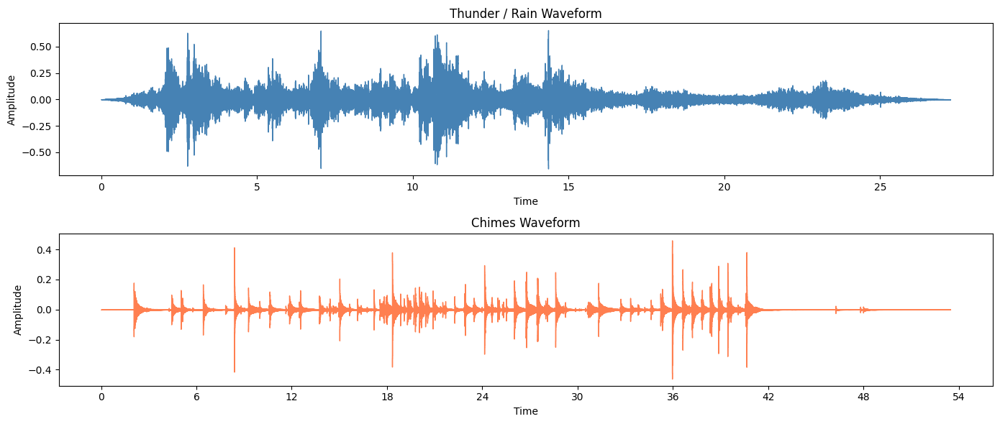

In [11]:
fig, axes = plt.subplots(2, 1, figsize=(14, 6), sharex=False)

# Thunder waveform
librosa.display.waveshow(thunder, sr=SR, ax=axes[0], color='steelblue')
axes[0].set_title('Thunder / Rain Waveform')
axes[0].set_ylabel('Amplitude')

# Chimes waveform
librosa.display.waveshow(chimes, sr=SR, ax=axes[1], color='coral')
axes[1].set_title('Chimes Waveform')
axes[1].set_ylabel('Amplitude')

plt.tight_layout()
plt.show()

**What do we see?**

- **Thunder/rain**: relatively constant amplitude with occasional spikes (thunder claps, heavy drips). The rain creates a continuous "bed" of sound.
- **Chimes**: clear attacks (sudden peaks) when each chime is struck, followed by decay (the tone fading out). The silence between strikes is visible.

Already we can see these are very different sounds. But the waveform doesn't tell us *which frequencies* make up each sound. For that, we need the frequency domain.

## Part 4: Frequency Spectrum (FFT)

The **Discrete Fourier Transform (DFT)** converts a signal from the time domain to the frequency domain. It answers: "which frequencies are present, and how strong are they?"

In practice, we use the **FFT** (Fast Fourier Transform), which is just an efficient algorithm for computing the DFT.

We'll take a short window of each sound (4096 samples ≈ 0.25s at 16kHz) and look at its spectrum.

In [12]:
def plot_spectrum(signal, sr, title, color='steelblue', n_fft=4096):
    """Plot the frequency spectrum of the first n_fft samples of a signal."""

    # Take a chunk of the signal
    chunk = signal[:n_fft]

    # Apply Hanning window — smooths the edges to avoid spectral leakage.
    # Without this, abruptly cutting the signal creates fake frequencies.
    window = np.hanning(len(chunk))
    windowed = chunk * window

    # Compute FFT — rfft is for real signals (returns only positive frequencies,
    # since the negative half is a mirror image)
    fft = np.fft.rfft(windowed)

    # Get amplitude in decibels — dB is a logarithmic scale that matches
    # how our ears perceive loudness. ref=np.max means the loudest frequency = 0 dB.
    amplitude = np.abs(fft)
    amplitude_db = librosa.amplitude_to_db(amplitude, ref=np.max)

    # Map each FFT bin to its actual frequency in Hz
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)

    plt.plot(freqs, amplitude_db, color=color, linewidth=0.7)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Amplitude (dB)')
    plt.title(title)
    plt.xscale('log')  # log scale because our ears perceive frequency logarithmically
    plt.xlim([20, sr/2])  # from 20 Hz (lowest we hear) to Nyquist limit
    plt.grid(True, alpha=0.3)

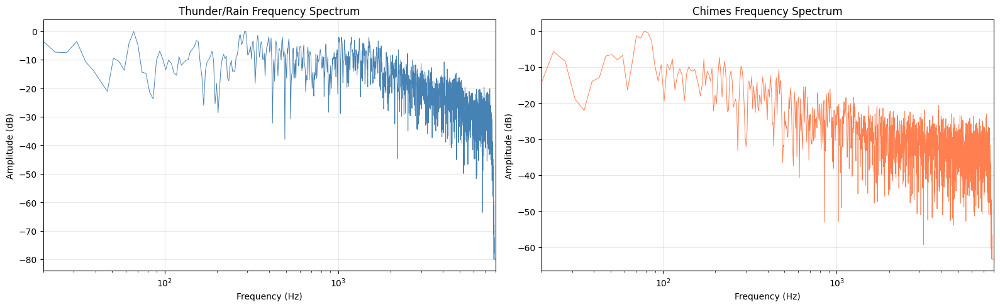

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

plt.sca(axes[0])
plot_spectrum(thunder, SR, 'Thunder/Rain Frequency Spectrum', color='steelblue')

plt.sca(axes[1])
plot_spectrum(chimes, SR, 'Chimes Frequency Spectrum', color='coral')

plt.tight_layout()
plt.show()

**Key difference:**

- **Thunder/rain**: energy is spread across many frequencies: this is what "broadband noise" looks like. Rain is essentially random fluctuations across the whole spectrum.
- **Chimes**: you should see distinct **peaks** at specific frequencies: these are the fundamental tones and harmonics of each chime. The peaks are where the energy is concentrated.

This is why frequency analysis is so powerful: two sounds that look similar as waveforms become clearly distinguishable in the frequency domain.

**But there's a problem**: the FFT gives us frequencies for one fixed window of time. What if we want to see how frequencies change *over time*? That's what the spectrogram does.

## Part 5: Spectrogram (STFT)

A **spectrogram** is what you get when you compute many FFTs on overlapping windows across the whole signal, then stack them side by side.

- X axis = time
- Y axis = frequency
- Color = amplitude (how strong that frequency is at that moment)

The algorithm is called the **Short-Time Fourier Transform (STFT)**. By default, `librosa.stft()` uses windows of 2048 samples, a good trade-off between time resolution and frequency resolution.

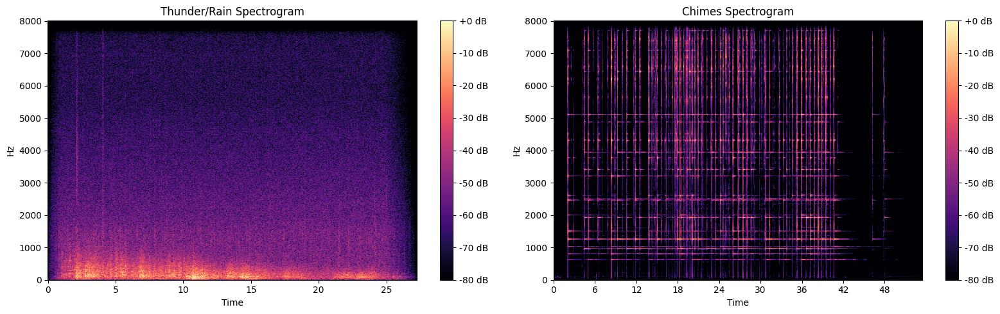

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

for ax, signal, title, name in [
    (axes[0], thunder, 'Thunder/Rain Spectrogram', 'thunder'),
    (axes[1], chimes,  'Chimes Spectrogram', 'chimes')
]:
    # STFT returns complex numbers; we take the magnitude
    D = librosa.stft(signal)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    img = librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=SR, ax=ax)
    ax.set_title(title)
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

plt.tight_layout()
plt.show()

**Now we can see time AND frequency together:**

- **Thunder/rain**: energy is smeared across all frequencies over time. You might see bright vertical bands where thunder claps happen (sudden broadband energy).
- **Chimes**: you should see horizontal lines (sustained tones at specific frequencies) that appear when a chime is struck and then fade out.

This is why spectrograms are the go-to input for many audio ML models: they're basically "images" of sound.

## Part 6: Mel Spectrogram

The mel spectrogram is what most ML models actually use (Whisper, for example, takes a log-mel spectrogram as input).

The idea: our ears don't perceive frequencies linearly. The difference between 100 Hz and 200 Hz sounds huge, but the difference between 8000 Hz and 8100 Hz is barely noticeable. The **mel scale** warps the frequency axis to match human perception: more resolution at low frequencies, less at high frequencies.

It's computed by passing the STFT output through a **mel filterbank**: a set of triangular filters spaced according to the mel scale.

Key parameters:
- `n_mels=128` — number of mel bands (like "frequency buckets")
- `fmax=8000` — highest frequency we care about (enough for speech; environmental sounds may benefit from higher)

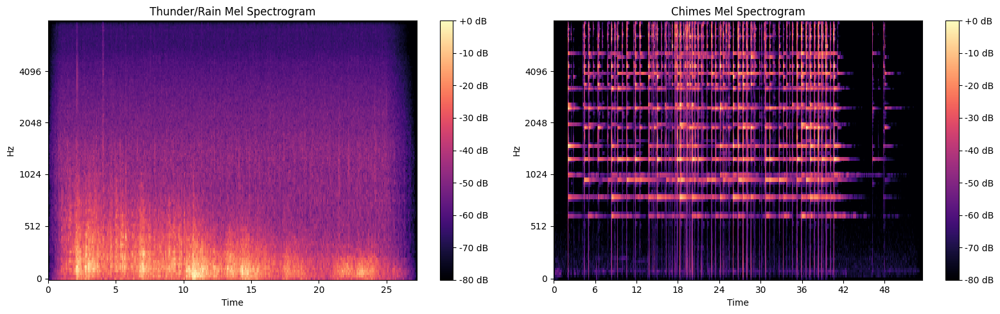

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

for ax, signal, title in [
    (axes[0], thunder, 'Thunder/Rain Mel Spectrogram'),
    (axes[1], chimes,  'Chimes Mel Spectrogram')
]:
    # melspectrogram returns a power spectrogram, so we use power_to_db (not amplitude_to_db)
    S = librosa.feature.melspectrogram(y=signal, sr=SR, n_mels=128, fmax=8000)
    S_db = librosa.power_to_db(S, ref=np.max)

    img = librosa.display.specshow(S_db, x_axis='time', y_axis='mel', sr=SR, fmax=8000, ax=ax)
    ax.set_title(title)
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

plt.tight_layout()
plt.show()

Notice how the y-axis is now in **mel** instead of Hz. The lower frequencies get more vertical space, which is where a lot of the interesting information lives.

### Summary of representations

| Representation | X axis | Y axis | Shows | Used for |
|---|---|---|---|---|
| **Waveform** | Time | Amplitude | When things happen | Quick inspection, editing |
| **FFT Spectrum** | Frequency | Amplitude | What frequencies exist | Single-point analysis |
| **Spectrogram** | Time | Frequency (linear) | Frequencies over time | Visualization, analysis |
| **Mel Spectrogram** | Time | Frequency (mel scale) | Perceptually-weighted frequencies | **ML model input** |

## Part 7: All four views side by side

Let's put everything together for each sound. This is the kind of visual that makes a good blog post.

In [16]:
def plot_all_views(signal, sr, name, color='steelblue'):
    """Plot waveform, FFT spectrum, spectrogram, and mel spectrogram for one sound."""
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    fig.suptitle(f'{name}', fontsize=16, fontweight='bold')

    # 1. Waveform
    librosa.display.waveshow(signal, sr=sr, ax=axes[0, 0], color=color)
    axes[0, 0].set_title('Waveform (time domain)')
    axes[0, 0].set_ylabel('Amplitude')

    # 2. FFT Spectrum (first 4096 samples)
    n_fft = 4096
    chunk = signal[:n_fft]
    window = np.hanning(len(chunk))
    fft = np.fft.rfft(chunk * window)
    amplitude_db = librosa.amplitude_to_db(np.abs(fft), ref=np.max)
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    axes[0, 1].plot(freqs, amplitude_db, color=color, linewidth=0.7)
    axes[0, 1].set_xscale('log')
    axes[0, 1].set_xlim([20, sr/2])
    axes[0, 1].set_xlabel('Frequency (Hz)')
    axes[0, 1].set_ylabel('Amplitude (dB)')
    axes[0, 1].set_title('Frequency Spectrum (FFT of first 0.25s)')
    axes[0, 1].grid(True, alpha=0.3)

    # 3. Spectrogram
    D = librosa.stft(signal)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    img1 = librosa.display.specshow(S_db, x_axis='time', y_axis='hz', sr=sr, ax=axes[1, 0])
    axes[1, 0].set_title('Spectrogram (STFT)')
    fig.colorbar(img1, ax=axes[1, 0], format='%+2.0f dB')

    # 4. Mel Spectrogram
    S_mel = librosa.feature.melspectrogram(y=signal, sr=sr, n_mels=128, fmax=8000)
    S_mel_db = librosa.power_to_db(S_mel, ref=np.max)
    img2 = librosa.display.specshow(S_mel_db, x_axis='time', y_axis='mel', sr=sr, fmax=8000, ax=axes[1, 1])
    axes[1, 1].set_title('Mel Spectrogram')
    fig.colorbar(img2, ax=axes[1, 1], format='%+2.0f dB')

    plt.tight_layout()
    plt.show()

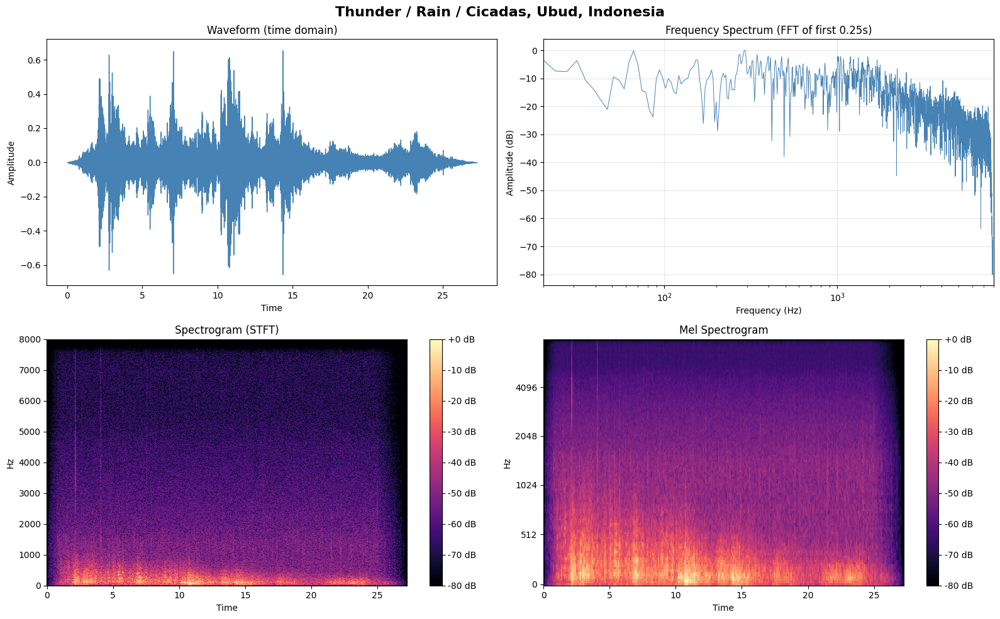

In [17]:
plot_all_views(thunder, SR, 'Thunder / Rain / Cicadas, Ubud, Indonesia', color='steelblue')

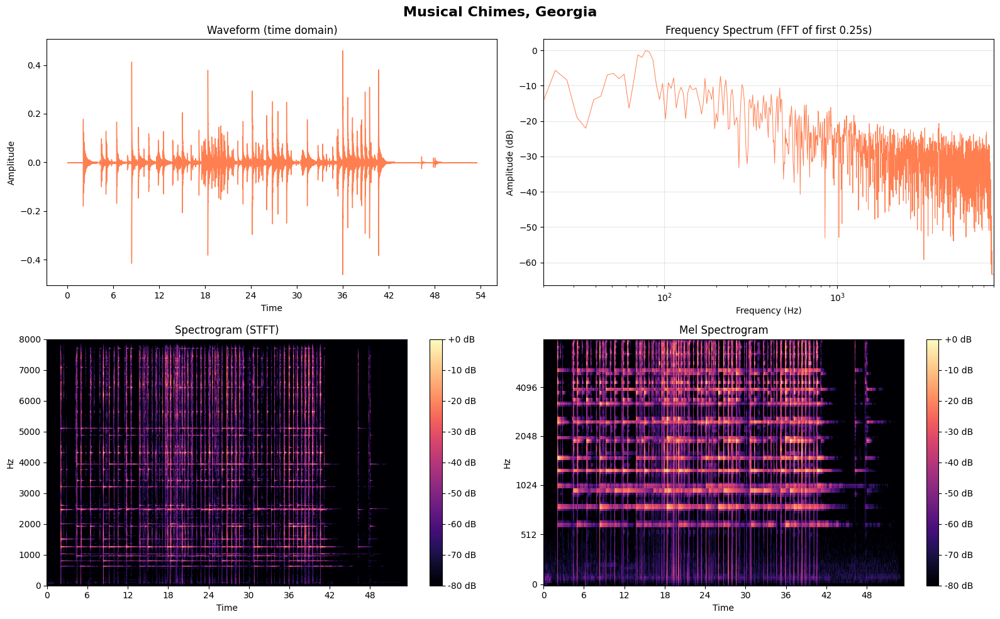

In [18]:
plot_all_views(chimes, SR, 'Musical Chimes, Georgia', color='coral')

---

## Part 8: Load and explore a HF Dataset ESC-50

The HF course uses MINDS-14 (a speech dataset). Since we're interested in environmental sounds, we use **ESC-50** instead.

ESC-50 = 2,000 clips × 5 seconds × 50 classes of environmental sounds. Classes include rain, sea waves, chimes, thunder, birds, dog barking, glass breaking, and much more. All originally from Freesound.org.

Key fields:
- `audio`: the actual audio data (`array` + `sampling_rate`)
- `category`: human-readable label (e.g. "rain", "sea_waves")
- `target`: numeric class label (0-49)
- `fold`: 1-5, for cross-validation (clips from the same original recording stay in the same fold)
- `esc10`: whether it belongs to the smaller ESC-10 subset
- `src_file`: Freesound ID of the original recording
- `take`: which fragment of the original was extracted

In [19]:
from datasets import load_dataset

dataset = load_dataset("ashraq/esc50", split="train")
print(dataset)
print(f"\nFeatures: {dataset.features}")
print(f"\nNumber of examples: {len(dataset)}")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/345 [00:00<?, ?B/s]

Repo card metadata block was not found. Setting CardData to empty.


dataset_infos.json: 0.00B [00:00, ?B/s]

data/train-00000-of-00002-2f1ab7b824ec75(…):   0%|          | 0.00/387M [00:00<?, ?B/s]

data/train-00001-of-00002-27425e5c1846b4(…):   0%|          | 0.00/387M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/2000 [00:00<?, ? examples/s]

Dataset({
    features: ['filename', 'fold', 'target', 'category', 'esc10', 'src_file', 'take', 'audio'],
    num_rows: 2000
})

Features: {'filename': Value('string'), 'fold': Value('int64'), 'target': Value('int64'), 'category': Value('string'), 'esc10': Value('bool'), 'src_file': Value('int64'), 'take': Value('string'), 'audio': Audio(sampling_rate=None, decode=True, stream_index=None)}

Number of examples: 2000


In [20]:
# Look at one example
example = dataset[0]
print(f"Category:      {example['category']}")
print(f"Target:        {example['target']}")
print(f"Fold:          {example['fold']}")
print(f"ESC-10:        {example['esc10']}")
print(f"Filename:      {example['filename']}")
print(f"Sample rate:   {example['audio']['sampling_rate']} Hz")
print(f"Array shape:   {np.array(example['audio']['array']).shape}")
print(f"Duration:      {len(example['audio']['array']) / example['audio']['sampling_rate']:.1f}s")

Category:      dog
Target:        0
Fold:          1
ESC-10:        True
Filename:      1-100032-A-0.wav
Sample rate:   44100 Hz
Array shape:   (220500,)
Duration:      5.0s


In [21]:
# What categories are available?
categories = sorted(set(dataset['category']))
print(f"{len(categories)} categories:\n")
for i, cat in enumerate(categories):
    print(f"  {i:2d}. {cat}", end='\t\t' if (i+1) % 3 != 0 else '\n')

50 categories:

   0. airplane		   1. breathing		   2. brushing_teeth
   3. can_opening		   4. car_horn		   5. cat
   6. chainsaw		   7. chirping_birds		   8. church_bells
   9. clapping		  10. clock_alarm		  11. clock_tick
  12. coughing		  13. cow		  14. crackling_fire
  15. crickets		  16. crow		  17. crying_baby
  18. dog		  19. door_wood_creaks		  20. door_wood_knock
  21. drinking_sipping		  22. engine		  23. fireworks
  24. footsteps		  25. frog		  26. glass_breaking
  27. hand_saw		  28. helicopter		  29. hen
  30. insects		  31. keyboard_typing		  32. laughing
  33. mouse_click		  34. pig		  35. pouring_water
  36. rain		  37. rooster		  38. sea_waves
  39. sheep		  40. siren		  41. sneezing
  42. snoring		  43. thunderstorm		  44. toilet_flush
  45. train		  46. vacuum_cleaner		  47. washing_machine
  48. water_drops		  49. wind		

### Listen to some examples from the dataset

Let's listen to sounds in categories similar to our own files:

In [22]:
# Filter for categories we care about
interesting_categories = ['rain', 'thunderstorm', 'sea_waves', 'church_bells', 'wind']

for cat in interesting_categories:
    subset = dataset.filter(lambda x: x['category'] == cat)
    example = subset[0]
    audio = example['audio']
    print(f"\n {cat} (fold {example['fold']})")
    display(Audio(audio['array'], rate=audio['sampling_rate']))

Filter:   0%|          | 0/2000 [00:00<?, ? examples/s]


 rain (fold 1)


Filter:   0%|          | 0/2000 [00:00<?, ? examples/s]


 thunderstorm (fold 1)


Filter:   0%|          | 0/2000 [00:00<?, ? examples/s]


 sea_waves (fold 1)


Filter:   0%|          | 0/2000 [00:00<?, ? examples/s]


 church_bells (fold 1)


Filter:   0%|          | 0/2000 [00:00<?, ? examples/s]


 wind (fold 1)


Filter:   0%|          | 0/2000 [00:00<?, ? examples/s]

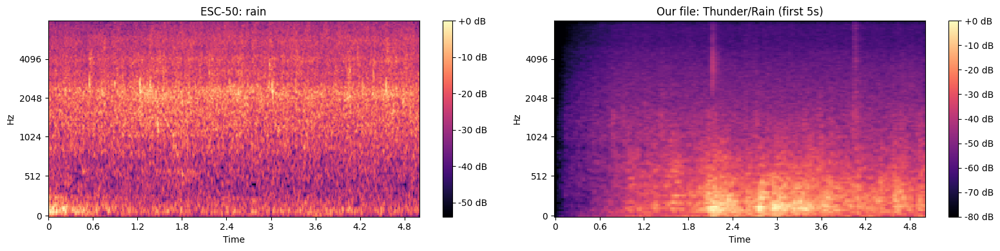

In [23]:
# Visualize a few ESC-50 examples side by side with our own sounds
rain_esc = dataset.filter(lambda x: x['category'] == 'rain')[0]

fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# ESC-50 rain
S = librosa.feature.melspectrogram(
    y=np.array(rain_esc['audio']['array'], dtype=np.float32),
    sr=rain_esc['audio']['sampling_rate'], n_mels=128, fmax=8000
)
img = librosa.display.specshow(
    librosa.power_to_db(S, ref=np.max),
    x_axis='time', y_axis='mel', sr=rain_esc['audio']['sampling_rate'],
    fmax=8000, ax=axes[0]
)
axes[0].set_title('ESC-50: rain')
fig.colorbar(img, ax=axes[0], format='%+2.0f dB')

# Our thunder/rain (first 5 seconds for fair comparison)
thunder_5s = thunder[:SR * 5]
S2 = librosa.feature.melspectrogram(y=thunder_5s, sr=SR, n_mels=128, fmax=8000)
img2 = librosa.display.specshow(
    librosa.power_to_db(S2, ref=np.max),
    x_axis='time', y_axis='mel', sr=SR, fmax=8000, ax=axes[1]
)
axes[1].set_title('Our file: Thunder/Rain (first 5s)')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

## Part 9: Preprocessing: Resampling with `cast_column`

ESC-50 audio is at 44.1 kHz. Most models expect 16 kHz. Instead of downloading everything and resampling manually, HF Datasets can resample **on the fly** when you access each example:

In [24]:
from datasets import Audio

# Before resampling
print(f"Before: {dataset[0]['audio']['sampling_rate']} Hz")

# Tell the dataset to resample on-the-fly to 16kHz
dataset_16k = dataset.cast_column("audio", Audio(sampling_rate=16000))

# Now when we access an example, it's resampled
print(f"After:  {dataset_16k[0]['audio']['sampling_rate']} Hz")

# Note: the original dataset object is NOT modified.
# cast_column returns a new dataset with a lazy resampling instruction.

Before: 44100 Hz
After:  16000 Hz


`cast_column` doesn't resample everything at once. The resampling happens only when you access each individual example. This is important for large datasets where you don't want to process millions of files upfront.

## Part 10: Feature Extraction with Whisper

ML models don't accept raw audio arrays. They need the audio converted into **input features**, typically a log-mel spectrogram with specific parameters.

Each model has its own feature extractor that knows exactly how to transform the audio. Whisper, for example, expects:
- 30-second chunks (padded if shorter)
- 80 mel bins
- 16 kHz sample rate

Let's see what Whisper's feature extractor does to our data:

In [25]:
from transformers import WhisperFeatureExtractor

feature_extractor = WhisperFeatureExtractor.from_pretrained("openai/whisper-small")

print(f"Expected sample rate: {feature_extractor.sampling_rate}")
print(f"Mel bins:            {feature_extractor.feature_size}")
print(f"FFT size:            {feature_extractor.n_fft}")
print(f"Hop length:          {feature_extractor.hop_length}")
print(f"Chunk length:        {feature_extractor.chunk_length}s")

preprocessor_config.json: 0.00B [00:00, ?B/s]

Expected sample rate: 16000
Mel bins:            80
FFT size:            400
Hop length:          160
Chunk length:        30s


In [26]:
# Apply the feature extractor to our thunder sound
inputs = feature_extractor(thunder, sampling_rate=SR, return_tensors="np")

print(f"Input features shape: {inputs['input_features'].shape}")
print(f"  → (batch=1, mel_bins=80, time_frames=3000)")
print(f"  → 3000 frames × 10ms hop = 30s (padded from {len(thunder)/SR:.1f}s)")

Input features shape: (1, 80, 3000)
  → (batch=1, mel_bins=80, time_frames=3000)
  → 3000 frames × 10ms hop = 30s (padded from 27.3s)


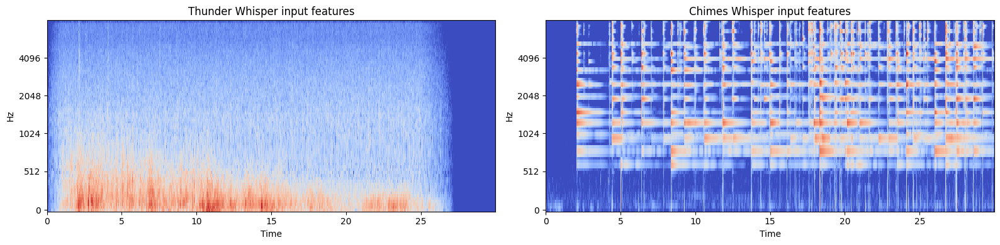

In [27]:
# Visualize what Whisper actually "sees"
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

for ax, signal, title in [
    (axes[0], thunder, 'Thunder Whisper input features'),
    (axes[1], chimes,  'Chimes Whisper input features')
]:
    inputs = feature_extractor(signal, sampling_rate=SR, return_tensors="np")
    librosa.display.specshow(
        inputs['input_features'][0],
        x_axis='time', y_axis='mel',
        sr=feature_extractor.sampling_rate,
        hop_length=feature_extractor.hop_length,
        ax=ax
    )
    ax.set_title(title)

plt.tight_layout()
plt.show()

This is literally what Whisper "sees" when it processes audio: a log-mel spectrogram with 80 mel bins and 3000 time frames (30 seconds). Shorter audio is zero-padded on the right.

### Applying the feature extractor to the whole dataset with `map`

The `map` function applies a transformation to every example. This is how you'd prepare an entire dataset for training:

In [28]:
def prepare_dataset(example):
    """Convert raw audio to Whisper input features."""
    audio = example["audio"]
    features = feature_extractor(
        audio["array"],
        sampling_rate=audio["sampling_rate"],
        padding=True
    )
    return features

# Apply to the resampled dataset (16kHz)
# We process just 10 examples to be quick
small_subset = dataset_16k.select(range(10))
processed = small_subset.map(prepare_dataset)

features = processed[0]['input_features']
print(f"Processed features: {np.array(features).shape}")
print(f"Category: {processed[0]['category']}")

Map:   0%|          | 0/10 [00:00<?, ? examples/s]

Processed features: (1, 80, 500)
Category: dog


### You can also use a Processor (feature extractor + tokenizer)

For models like Whisper that handle both audio input AND text output, HF provides an `AutoProcessor` that bundles the feature extractor with a tokenizer:

In [29]:
from transformers import AutoProcessor

processor = AutoProcessor.from_pretrained("openai/whisper-small")

# The processor contains both:
print(f"Feature extractor: {type(processor.feature_extractor).__name__}")
print(f"Tokenizer:         {type(processor.tokenizer).__name__}")

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

normalizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

Feature extractor: WhisperFeatureExtractor
Tokenizer:         WhisperTokenizer


## Part 11: Streaming: working with huge datasets without downloading them

> Add blockquote



Audio datasets can be enormous. GigaSpeech's full version is over 1 TB. You can't download that on a Colab instance.

**Streaming mode** loads examples one at a time, on the fly — no disk space needed.

The trade-off: you can't index by position (`dataset[42]`), you can only iterate.

In [30]:
# Streaming ESC-50: same syntax, just add streaming=True
esc50_stream = load_dataset("ashraq/esc50", split="train", streaming=True)

# Can't do esc50_stream[0] — must iterate
# next() grabs the first item from the iterator
first = next(iter(esc50_stream))
print(f"Category: {first['category']}")
print(f"Sample rate: {first['audio']['sampling_rate']}")

Repo card metadata block was not found. Setting CardData to empty.


Category: dog
Sample rate: 44100


In [31]:
# take() grabs the first N examples: very useful for quick experiments
for i, example in enumerate(esc50_stream.take(5)):
    print(f"  {i}: {example['category']:<20s} ({example['audio']['sampling_rate']} Hz)")

  0: dog                  (44100 Hz)
  1: chirping_birds       (44100 Hz)
  2: vacuum_cleaner       (44100 Hz)
  3: vacuum_cleaner       (44100 Hz)
  4: thunderstorm         (44100 Hz)


In [32]:
# You can also resample streamed data on the fly
esc50_stream_16k = esc50_stream.cast_column("audio", Audio(sampling_rate=16000))

first_16k = next(iter(esc50_stream_16k))
print(f"After cast_column: {first_16k['audio']['sampling_rate']} Hz")

After cast_column: 16000 Hz


### When to use streaming?

| Situation | Use streaming? |
|---|---|
| Dataset fits on disk, you'll reuse it | ❌ Download once |
| Dataset is huge (100+ GB) | ✅ Stream |
| Quick experiment, just need a few examples | ✅ Stream |
| Evaluating on many datasets sequentially | ✅ Stream |

For ESC-50 (~600 MB), streaming is optional. For AudioSet (~2M clips), it's essential.

---

## Recap

In this chapter we covered:

1. **Audio basics**: sampling rate, amplitude, bit depth and what they mean in practice
2. **Four representations**: waveform → FFT spectrum → spectrogram → mel spectrogram, each revealing different information
3. **Loading custom audio** with librosa and listening with IPython.display.Audio
4. **HF Datasets**: loading ESC-50 (environmental sounds), exploring features, filtering by category
5. **Preprocessing**: resampling with `cast_column`, feature extraction with Whisper's feature extractor
6. **Streaming**: `streaming=True` for working with datasets that don't fit on disk

**Key insight from comparing our two sounds**: thunder/rain and chimes look very different in the frequency domain, broadband noise vs. clear tonal peaks. This is exactly what ML models exploit for classification. The mel spectrogram is the most common input representation because it captures frequency information on a perceptually meaningful scale.

📖 **Based on**: [HF Audio Course - Unit 1](https://huggingface.co/learn/audio-course/en/chapter1/introduction)